# Fourier Transform

In [7]:
print("This is a feature")

This is a feature


In [ ]:
print("This is another feature")

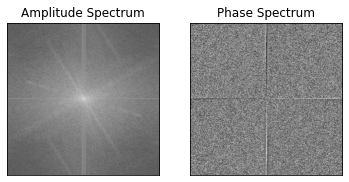

In [20]:
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
img = plt.imread('image.jpg')

# Convert the image to grayscale
gray_img = np.dot(img[...,:3], [0.299, 0.587, 0.114])

# Apply FFT to the image
f = np.fft.fft2(gray_img)
fshift = np.fft.fftshift(f)

# Calculate the amplitude and phase images
magnitude_spectrum = 20*np.log(np.abs(fshift))
phase_spectrum = np.angle(fshift)

# Display the amplitude and phase images
plt.subplot(121), plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Amplitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(phase_spectrum, cmap='gray')
plt.title('Phase Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

In [14]:
import numpy as np

def fft_filter(image, low=None, high=None):
    """
    Apply FFT to an input image and filter out the specified frequency range.
    
    Parameters:
    image (numpy.ndarray): Input image to be filtered.
    low (float, optional): Lower frequency limit for the filter (in pixels). Defaults to None.
    high (float, optional): Upper frequency limit for the filter (in pixels). Defaults to None.
    
    Returns:
    numpy.ndarray: Filtered image.
    """
    # Convert the image to grayscale
    gray_img = np.dot(image[...,:3], [0.299, 0.587, 0.114])

    # Apply FFT to the image
    f = np.fft.fft2(gray_img)
    fshift = np.fft.fftshift(f)
    
    # Calculate the amplitude spectrum
    magnitude_spectrum = np.abs(fshift)
    
    # Apply frequency filtering if low and high frequency values are provided
    if low is not None or high is not None:
        rows, cols = image.shape[:2]
        crow, ccol = int(rows/2), int(cols/2)
        fshift[crow, ccol] = 0
        if low is not None:
            fshift[:crow-low, :] = 0
            fshift[crow+low:, :] = 0
            fshift[:, :ccol-low] = 0
            fshift[:, ccol+low:] = 0
        if high is not None:
            mask = np.zeros((rows, cols), np.uint8)
            cv2.circle(mask, (ccol, crow), high, 1, -1)
            fshift = fshift * mask

    # Apply inverse FFT to obtain the filtered image
    f_ishift = np.fft.ifftshift(fshift)
    img_back = np.fft.ifft2(f_ishift)
    filtered_image = np.real(img_back)

    # Normalize the filtered image to the range [0, 255]
    filtered_image = (filtered_image - np.min(filtered_image)) * (255 / (np.max(filtered_image) - np.min(filtered_image)))
    
    return filtered_image.astype(np.uint8)


C:\Users\Lyle\AppData\Local\Temp\ipykernel_64320\1422757762.py:46: RuntimeWarning: divide by zero encountered in double_scalars
  filtered_image = (filtered_image - np.min(filtered_image)) * (255 / (np.max(filtered_image) - np.min(filtered_image)))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_64320\1422757762.py:46: RuntimeWarning: invalid value encountered in multiply
  filtered_image = (filtered_image - np.min(filtered_image)) * (255 / (np.max(filtered_image) - np.min(filtered_image)))


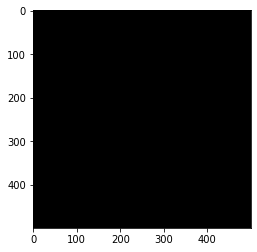

In [47]:

filtered_img = fft_filter(img, low=0, high = 5)

plt.imshow(filtered_img, cmap='gray')
plt.show()

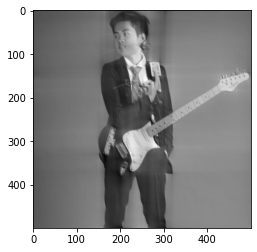

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

def filter_image_freq(img, freq_range):
    """
    Apply a frequency filter to an image using Fourier Transform.

    img: numpy array of the input image.
    freq_range: tuple of (min_freq, max_freq) to be clipped or filtered.

    returns: numpy array of the filtered image.
    """
    # Compute the 2-D Fourier Transform of the image
    f = fftpack.fft2(img)

    # Shift the zero-frequency component to the center of the spectrum
    fshift = fftpack.fftshift(f)

    # Compute the magnitude spectrum
    magnitude_spectrum = 20*np.log(np.abs(fshift))

    # Define the frequency ranges to be clipped or filtered
    rows, cols = img.shape
    crow, ccol = rows//2, cols//2
    r_min, r_max = int(crow*(1-freq_range[1])), int(crow*(1-freq_range[0]))
    c_min, c_max = int(ccol*(1-freq_range[1])), int(ccol*(1-freq_range[0]))

    # Apply the frequency filter by clipping the spectrum
    fshift[r_min:r_max, c_min:c_max] = 0

    # Shift the zero-frequency component back to the corner of the spectrum
    f_ishift = fftpack.ifftshift(fshift)

    # Compute the inverse Fourier Transform of the filtered spectrum
    img_filtered = np.real(fftpack.ifft2(f_ishift))

    return img_filtered

# Example usage
img = plt.imread('image.jpg')
img_gray = np.mean(img, axis=2)  # Convert to grayscale
img_filtered = filter_image_freq(img_gray, (0, 8))  # Apply frequency filter
plt.imshow(img_filtered, cmap='gray')
plt.show()


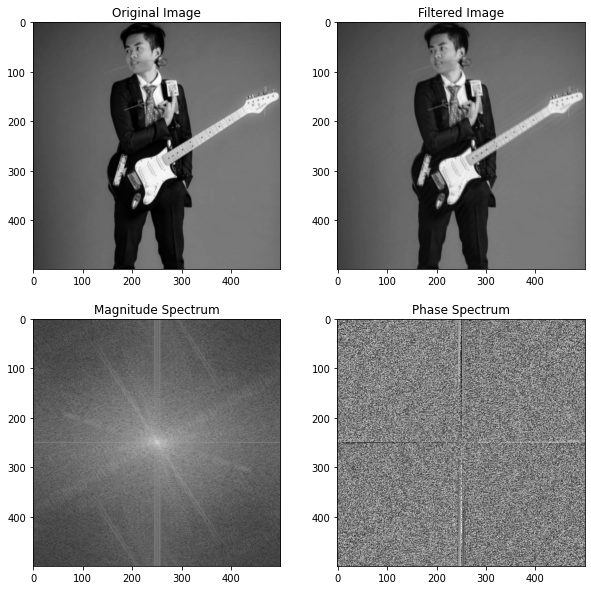

In [51]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

def filter_image_freq(img, freq_range):
    """
    Apply a frequency filter to an image using Fourier Transform.

    img: numpy array of the input image.
    freq_range: tuple of (min_freq, max_freq) to be clipped or filtered.

    returns: numpy array of the filtered image.
    """
    # Compute the 2-D Fourier Transform of the image
    f = fftpack.fft2(img)

    # Shift the zero-frequency component to the center of the spectrum
    fshift = fftpack.fftshift(f)

    # Compute the magnitude and phase spectra
    magnitude_spectrum = 20*np.log(np.abs(fshift))
    phase_spectrum = np.angle(fshift)

    # Define the frequency ranges to be clipped or filtered
    rows, cols = img.shape
    crow, ccol = rows//2, cols//2
    r_min, r_max = int(crow*(1-freq_range[1])), int(crow*(1-freq_range[0]))
    c_min, c_max = int(ccol*(1-freq_range[1])), int(ccol*(1-freq_range[0]))

    # Apply the frequency filter by clipping the spectrum
    fshift[r_min:r_max, c_min:c_max] = 0

    # Shift the zero-frequency component back to the corner of the spectrum
    f_ishift = fftpack.ifftshift(fshift)

    # Compute the inverse Fourier Transform of the filtered spectrum
    img_filtered = np.real(fftpack.ifft2(f_ishift))

    # Display the original and filtered images, and the magnitude and phase spectra
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))
    axs[0, 0].imshow(img, cmap='gray')
    axs[0, 0].set_title('Original Image')
    axs[0, 1].imshow(img_filtered, cmap='gray')
    axs[0, 1].set_title('Filtered Image')
    axs[1, 0].imshow(magnitude_spectrum, cmap='gray')
    axs[1, 0].set_title('Magnitude Spectrum')
    axs[1, 1].imshow(phase_spectrum, cmap='gray')
    axs[1, 1].set_title('Phase Spectrum')
    plt.show()

    return img_filtered

# Example usage
img = plt.imread('image.jpg')
img_gray = np.mean(img, axis=2)  # Convert to grayscale
img_filtered = filter_image_freq(img_gray, (0.1, 0.9))  # Apply frequency filter


C:\Users\Lyle\AppData\Local\Temp\ipykernel_64320\3129650716.py:35: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_clip = 20*np.log(np.abs(fshift_clip))


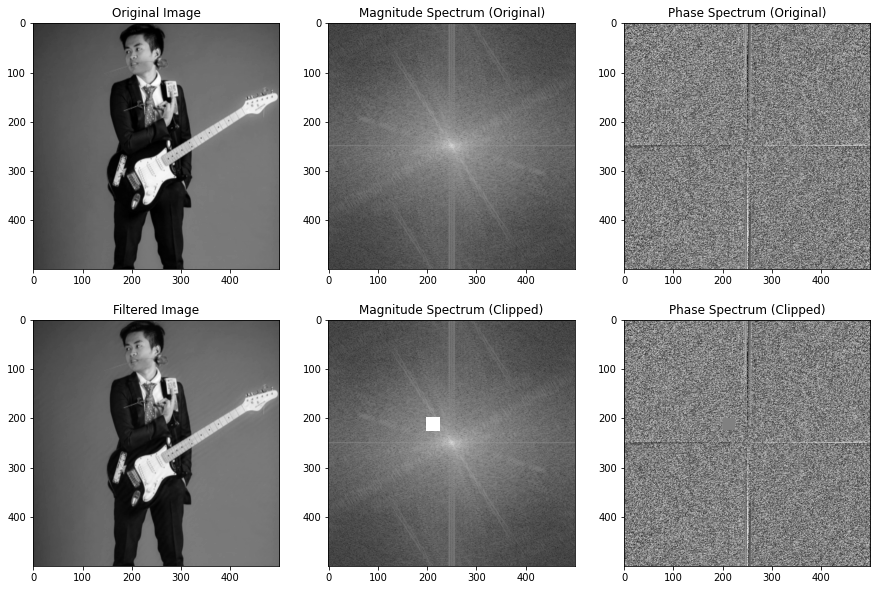

In [186]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

def filter_image_freq(img, freq_range):
    """
    Apply a frequency filter to an image using Fourier Transform.

    img: numpy array of the input image.
    freq_range: tuple of (min_freq, max_freq) to be clipped or filtered.

    returns: numpy array of the filtered image.
    """
    # Compute the 2-D Fourier Transform of the image
    f = fftpack.fft2(img)

    # Shift the zero-frequency component to the center of the spectrum
    fshift = fftpack.fftshift(f)

    # Compute the magnitude and phase spectra of the original image
    magnitude_spectrum_orig = 20*np.log(np.abs(fshift))
    phase_spectrum_orig = np.angle(fshift)

    # Define the frequency ranges to be clipped or filtered
    rows, cols = img.shape
    crow, ccol = rows//2, cols//2
    r_min, r_max = int(crow*(1-freq_range[1])), int(crow*(1-freq_range[0]))
    c_min, c_max = int(ccol*(1-freq_range[1])), int(ccol*(1-freq_range[0]))

    # Apply the frequency filter by clipping the spectrum
    fshift_clip = fshift.copy()
    fshift_clip[r_min:r_max, c_min:c_max] = 0

    # Compute the magnitude and phase spectra of the clipped image
    magnitude_spectrum_clip = 20*np.log(np.abs(fshift_clip))
    phase_spectrum_clip = np.angle(fshift_clip)

    # Shift the zero-frequency component back to the corner of the spectrum
    f_ishift_clip = fftpack.ifftshift(fshift_clip)

    # Compute the inverse Fourier Transform of the filtered spectrum
    img_filtered = np.real(fftpack.ifft2(f_ishift_clip))

    # Display the original and filtered images, and their associated magnitude and phase spectra
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    axs[0, 0].imshow(img, cmap='gray')
    axs[0, 0].set_title('Original Image')
    axs[0, 1].imshow(magnitude_spectrum_orig, cmap='gray')
    axs[0, 1].set_title('Magnitude Spectrum (Original)')
    axs[0, 2].imshow(phase_spectrum_orig, cmap='gray')
    axs[0, 2].set_title('Phase Spectrum (Original)')
    axs[1, 0].imshow(img_filtered, cmap='gray')
    axs[1, 0].set_title('Filtered Image')
    axs[1, 1].imshow(magnitude_spectrum_clip, cmap='gray')
    axs[1, 1].set_title('Magnitude Spectrum (Clipped)')
    axs[1, 2].imshow(phase_spectrum_clip, cmap='gray')
    axs[1, 2].set_title('Phase Spectrum (Clipped)')
    plt.show()

    return img_filtered

# Example usage
img = plt.imread('image.jpg')
img_gray = np.mean(img, axis=2)  # Convert to grayscale
img_filtered = filter_image_freq(img_gray, (0.1, 0.2))  # Apply frequency filter


C:\Users\Lyle\AppData\Local\Temp\ipykernel_64320\3129650716.py:35: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_clip = 20*np.log(np.abs(fshift_clip))


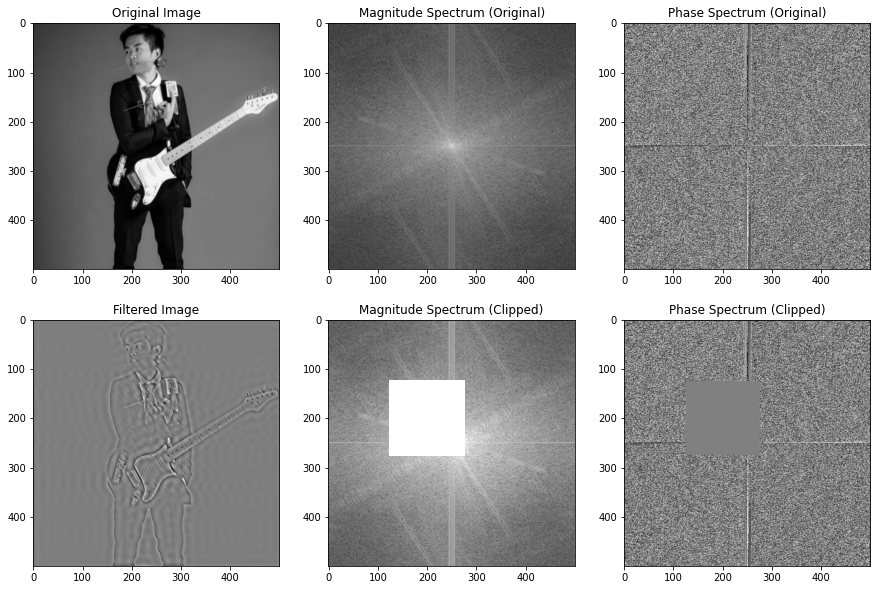

In [64]:
# Example usage
img = plt.imread('image.jpg')
img_gray = np.mean(img, axis=2)  # Convert to grayscale
img_filtered = filter_image_freq(img_gray, (-0.1, 0.5))  # Apply frequency filter


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def fourier_transform_image(img_path, freq_range, save_images=False):
    # Load the image and convert it to grayscale
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    # Compute the Fourier transform of the image
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)

    # Define the frequency ranges to be clipped or filtered
    rows, cols = img.shape
    crow, ccol = rows//2, cols//2
    r_min, r_max = int(crow*(1-freq_range[1])), int(crow*(1-freq_range[0]))
    c_min, c_max = int(ccol*(1-freq_range[1])), int(ccol*(1-freq_range[0]))

    # Apply the frequency filter by clipping the spectrum
    fshift_clip = fshift.copy()
    fshift_clip[r_min:r_max, c_min:c_max] = 0

    # Compute the inverse Fourier transform of the clipped spectrum
    f_ishift_clip = np.fft.ifftshift(fshift_clip)
    img_clip = np.fft.ifft2(f_ishift_clip)
    img_clip = np.abs(img_clip)

    # Compute the magnitude and phase spectra of the original and clipped images
    magnitude_spectrum = 20*np.log(np.abs(fshift))
    phase_spectrum = np.angle(fshift)
    magnitude_spectrum_clip = 20*np.log(np.abs(fshift_clip))
    phase_spectrum_clip = np.angle(fshift_clip)

    # Display the images and spectra
    plt.figure(figsize=(16,16))
    plt.subplot(321), plt.imshow(img, cmap='gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(322), plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
    plt.subplot(323), plt.imshow(phase_spectrum, cmap='gray')
    plt.title('Phase Spectrum'), plt.xticks([]), plt.yticks([])
    plt.subplot(324), plt.imshow(img_clip, cmap='gray')
    plt.title('Clipped Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(325), plt.imshow(magnitude_spectrum_clip, cmap='gray')
    plt.title('Clipped Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
    plt.subplot(326), plt.imshow(phase_spectrum_clip, cmap='gray')
    plt.title('Clipped Phase Spectrum'), plt.xticks([]), plt.yticks([])

    if save_images:
        # Save the images individually
        plt.subplot(321), plt.imsave('original_image.png', img, cmap='gray')
        plt.subplot(322), plt.imsave('magnitude_spectrum.png', magnitude_spectrum, cmap='gray')
        plt.subplot(323), plt.imsave('phase_spectrum.png', phase_spectrum, cmap='gray')
        plt.subplot(324), plt.imsave('clipped_image.png', img_clip, cmap='gray')
        plt.subplot(325), plt.imsave('clipped_magnitude_spectrum.png', magnitude_spectrum_clip, cmap='gray')
        plt.subplot(326), plt.imsave('clipped_phase_spectrum.png', phase_spectrum_clip, cmap='gray')

    plt.show()


In [148]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def fourier_transform_image(img_path, freq_range, save_images=False):
    # Load the image and convert it to grayscale
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    # Compute the Fourier transform of the image
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)

    # Define the frequency ranges to be clipped or filtered
    rows, cols = img.shape
    crow, ccol = rows//2, cols//2
    r_min, r_max = int(crow*(1-freq_range[1])), int(crow*(1-freq_range[0]))
    c_min, c_max = int(ccol*(1-freq_range[1])), int(ccol*(1-freq_range[0]))

    # Apply the frequency filter by clipping the spectrum
    fshift_clip = fshift.copy()
    fshift_clip[r_min:r_max, c_min:c_max] = 0

    # Compute the inverse Fourier transform of the clipped spectrum
    f_ishift_clip = np.fft.ifftshift(fshift_clip)
    img_clip = np.fft.ifft2(f_ishift_clip)
    img_clip = np.abs(img_clip)

    # Compute the magnitude and phase spectra of the original and clipped images
    magnitude_spectrum = 20*np.log(np.abs(fshift))
    phase_spectrum = np.angle(fshift)
    magnitude_spectrum_clip = 20*np.log(np.abs(fshift_clip))
    phase_spectrum_clip = np.angle(fshift_clip)

    # Display the images and spectra
    plt.figure(figsize=(16,16))
    plt.subplot(321), plt.imshow(img, cmap='gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(322), plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
    plt.subplot(323), plt.imshow(phase_spectrum, cmap='gray')
    plt.title('Phase Spectrum'), plt.xticks([]), plt.yticks([])
    plt.subplot(324), plt.imshow(img_clip, cmap='gray')
    plt.title('Clipped Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(325), plt.imshow(magnitude_spectrum_clip, cmap='gray')
    plt.title('Clipped Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
    plt.subplot(326), plt.imshow(phase_spectrum_clip, cmap='gray')
    plt.title('Clipped Phase Spectrum'), plt.xticks([]), plt.yticks([])

    if save_images:
        # Save the images individually
        plt.subplot(321), plt.imsave(f'original_image.png', img, cmap='gray')
        plt.subplot(322), plt.imsave(f'magnitude_spectrum.png', magnitude_spectrum, cmap='gray')
        plt.subplot(323), plt.imsave(f'phase_spectrum.png', phase_spectrum, cmap='gray')
        plt.subplot(324), plt.imsave(f'clipped_image_{freq_range[0]}_{freq_range[1]}.png', img_clip, cmap='gray')
        plt.subplot(325), plt.imsave(f'clipped_magnitude_spectrum_{freq_range[0]}_{freq_range[1]}.png', magnitude_spectrum_clip, cmap='gray')
        plt.subplot(326), plt.imsave(f'clipped_phase_spectrum_{freq_range[0]}_{freq_range[1]}.png', phase_spectrum_clip, cmap='gray')
    
    plt.show()


C:\Users\Lyle\AppData\Local\Temp\ipykernel_64320\3129650716.py:35: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_clip = 20*np.log(np.abs(fshift_clip))


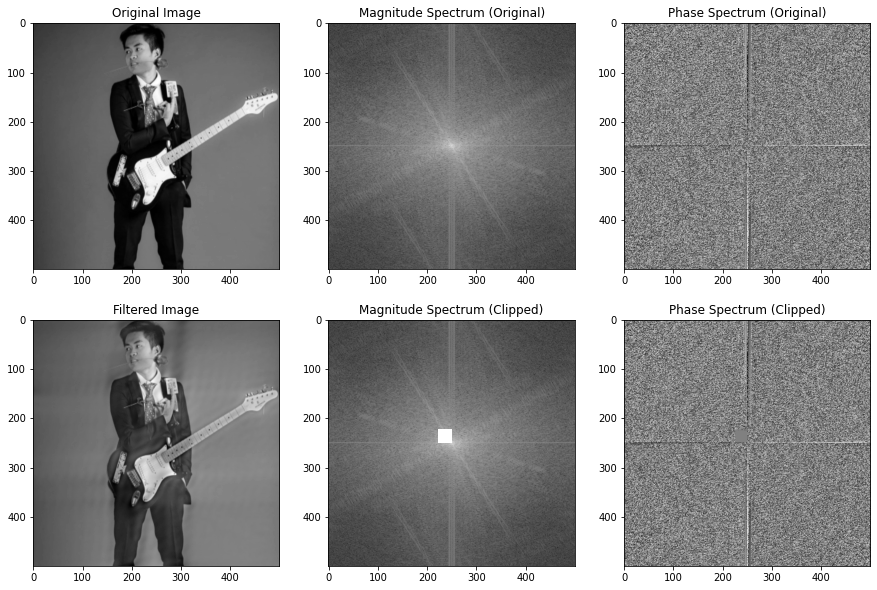

In [147]:
# Example usage
img = plt.imread('image.jpg')
img_gray = np.mean(img, axis=2)  # Convert to grayscale
img_filtered = filter_image_freq(img_gray, (0, 0.1))  # Apply frequency filter


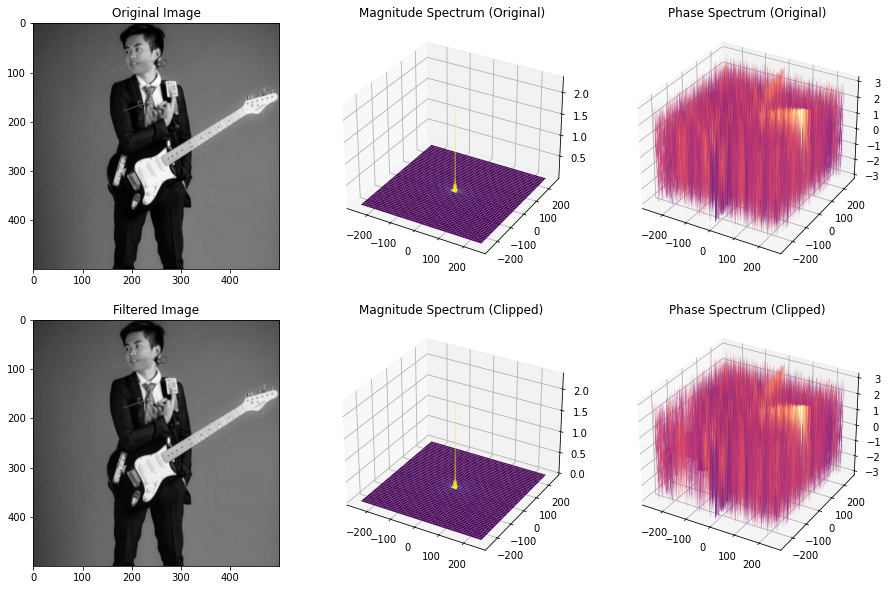

In [345]:
def filter_image_freq(img, freq_range):
    # Compute the 2-D Fourier Transform of the image
    f = fftpack.fft2(img)

    # Shift the zero-frequency component to the center of the spectrum
    fshift = fftpack.fftshift(f)

    # Compute the magnitude and phase spectra of the original image
    magnitude_spectrum_orig = np.abs(fshift)
    phase_spectrum_orig = np.angle(fshift)

    # Define the frequency ranges to be clipped or filtered
    rows, cols = img.shape
    crow, ccol = rows//2, cols//2
    r_min, r_max = int(crow*(1-freq_range[1])), int(crow*(1-freq_range[0]))
    c_min, c_max = int(ccol*(1-freq_range[1])), int(ccol*(1-freq_range[0]))

    # Apply the frequency filter by clipping the spectrum
    fshift_clip = fshift.copy()
    fshift_clip[r_min:r_max, c_min:c_max] = 0

    # Compute the magnitude and phase spectra of the clipped image
    magnitude_spectrum_clip = np.abs(fshift_clip)
    phase_spectrum_clip = np.angle(fshift_clip)

    # Shift the zero-frequency component back to the corner of the spectrum
    f_ishift_clip = fftpack.ifftshift(fshift_clip)

    # Compute the inverse Fourier Transform of the filtered spectrum
    img_filtered = np.real(fftpack.ifft2(f_ishift_clip))

    # Display the original and filtered images, and their associated magnitude and phase spectra
    fig = plt.figure(figsize=(15, 10))

    # Add a 3D histogram contour plot of the magnitude spectrum
    ax1 = fig.add_subplot(2, 3, 2, projection='3d')
    X, Y = np.meshgrid(np.arange(-cols/2, cols/2), np.arange(-rows/2, rows/2))
    ax1.plot_surface(X, Y, magnitude_spectrum_orig, cmap='viridis')
    ax1.set_title('Magnitude Spectrum (Original)')

    # Add a 3D histogram contour plot of the clipped magnitude spectrum
    ax2 = fig.add_subplot(2, 3, 5, projection='3d')
    ax2.plot_surface(X, Y, magnitude_spectrum_clip, cmap='viridis')
    ax2.set_title('Magnitude Spectrum (Clipped)')

    # Add a 3D histogram contour plot of the phase spectrum
    ax3 = fig.add_subplot(2, 3, 3, projection='3d')
    ax3.plot_surface(X, Y, phase_spectrum_orig, cmap='magma')
    ax3.set_title('Phase Spectrum (Original)')

    # Add a 3D histogram contour plot of the clipped phase spectrum
    ax4 = fig.add_subplot(2, 3, 6, projection='3d')
    ax4.plot_surface(X, Y, phase_spectrum_clip, cmap='magma')
    ax4.set_title('Phase Spectrum (Clipped)')

    # Display the original and filtered images
    ax5 = fig.add_subplot(2, 3, 1)
    ax5.imshow(img, cmap='gray')
    ax5.set_title('Original Image')

    ax6 = fig.add_subplot(2, 3, 4)
    ax6.imshow(img_filtered, cmap='gray')
    ax6.set_title('Filtered Image')

    plt.show()

    return img_filtered


# Example usage
img = plt.imread('image.jpg')
img_gray = np.mean(img, axis=2)  # Convert to grayscale
img_filtered = filter_image_freq(img_gray, (0.2, 0.9))  # Apply frequency filter


# Circle Clipping

C:\Users\Lyle\AppData\Local\Temp\ipykernel_35216\3085481608.py:27: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_clipped = 20*np.log(np.abs(fshift_clipped))


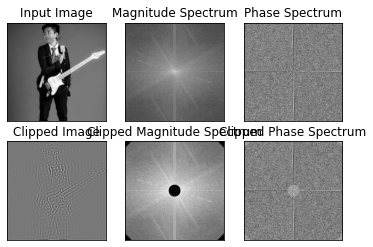

array([[-28.50140408, -13.8138305 , -12.62416522, ...,  -5.54773498,
         -3.00553718,   0.84567004],
       [-26.24691762, -11.93448484,  -9.72347782, ...,  -2.80488588,
         -0.33819263,   3.1250664 ],
       [-24.29131561,  -9.97038897,  -8.06664673, ...,  -0.189301  ,
          1.97681493,   5.40401421],
       ...,
       [-29.5147352 , -12.32199598,  -7.32785136, ...,  18.72730558,
         22.32641325,  25.83652371],
       [-26.75286826, -10.6012858 ,  -6.02807555, ...,  21.59960482,
         24.68832334,  28.0971531 ],
       [-24.57297066,  -8.87368819,  -4.29551291, ...,  24.43347085,
         28.41503319,  31.33321021]])

In [30]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

def fourier_transform(image_path, inner_radius, outer_radius):
    # Load image
    img = cv2.imread(image_path, 0)

    # Perform Fourier transform
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift))
    phase_spectrum = np.angle(fshift)

    # Create mask for circle clipping
    rows, cols = img.shape
    crow, ccol = rows // 2, cols // 2
    Y, X = np.ogrid[:rows, :cols]
    mask = np.zeros((rows, cols))
    mask_outer = (X - ccol)**2 + (Y - crow)**2 <= outer_radius**2
    mask_inner = (X - ccol)**2 + (Y - crow)**2 <= inner_radius**2
    mask[mask_outer] = 1
    mask[mask_inner] = 0

    # Apply mask to Fourier transform
    fshift_clipped = fshift * mask
    magnitude_spectrum_clipped = 20*np.log(np.abs(fshift_clipped))
    magnitude_spectrum_clipped = np.where(mask != 1, 0, magnitude_spectrum_clipped) # Set clipped area to black
    phase_spectrum_clipped = np.angle(fshift_clipped)

    # Perform inverse Fourier transform on clipped Fourier transform
    f_ishift_clipped = np.fft.ifftshift(fshift_clipped)
    img_clipped = np.fft.ifft2(f_ishift_clipped).real

    # Display images
    plt.subplot(231),plt.imshow(img, cmap = 'gray')
    plt.title('Input Image'), plt.xticks([]), plt.yticks([])
   
    plt.subplot(232),plt.imshow(magnitude_spectrum, cmap = 'gray')
    plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
 
    plt.subplot(233),plt.imshow(phase_spectrum, cmap = 'gray')
    plt.title('Phase Spectrum'), plt.xticks([]), plt.yticks([])

    plt.subplot(234),plt.imshow(img_clipped , cmap = 'gray')
    plt.title('Clipped Image'), plt.xticks([]), plt.yticks([])
        
    plt.subplot(235),plt.imshow(magnitude_spectrum_clipped, cmap = 'gray')
    plt.title('Clipped Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
   
    plt.subplot(236),plt.imshow(phase_spectrum_clipped, cmap = 'gray')
    plt.title('Clipped Phase Spectrum'), plt.xticks([]), plt.yticks([])
  
    plt.show()


    
    return img_clipped

fourier_transform('image.jpg',30, 330)



    
    


## Fourier Rendering Function

In [ ]:
 #plt.subplot(234),plt.imshow(mask, cmap = 'gray')
    #plt.title('Mask'), plt.xticks([]), plt.yticks([])

C:\Users\Lyle\AppData\Local\Temp\ipykernel_35216\2226400454.py:30: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_clipped = 20*np.log(np.abs(fshift_clipped))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_35216\2226400454.py:30: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_clipped = 20*np.log(np.abs(fshift_clipped))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_35216\2226400454.py:30: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_clipped = 20*np.log(np.abs(fshift_clipped))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_35216\2226400454.py:30: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_clipped = 20*np.log(np.abs(fshift_clipped))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_35216\2226400454.py:30: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_clipped = 20*np.log(np.abs(fshift_clipped))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_35216\2226400454.py:30: RuntimeWarning: divide 

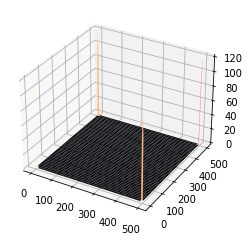

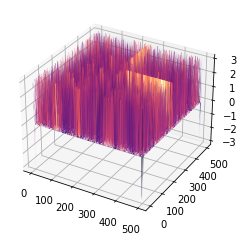

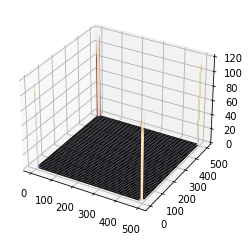

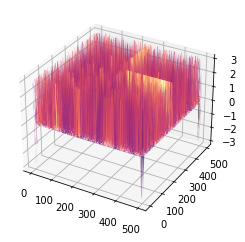

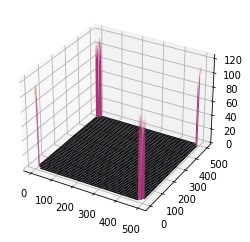

...

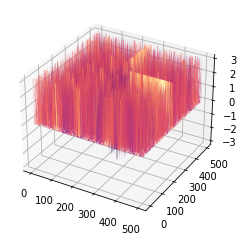

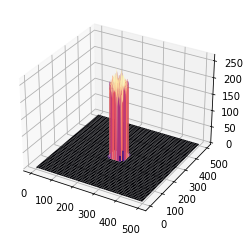

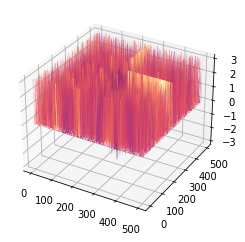

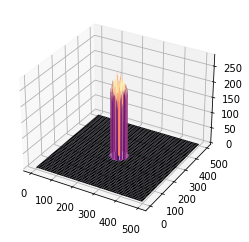

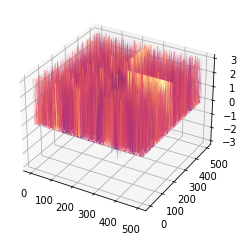

In [37]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def fourier_transform(image_path, inner_radius, outer_radius):
    dummy_outer_radius = 500 - outer_radius
    
    # Load image
    img = cv2.imread(image_path, 0)

    # Perform Fourier transform
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift))
    phase_spectrum = np.angle(fshift)

    # Create mask for circle clipping
    rows, cols = img.shape
    crow, ccol = rows // 2, cols // 2
    Y, X = np.ogrid[:rows, :cols]
    mask = np.zeros((rows, cols))
    mask_outer = (X - ccol)**2 + (Y - crow)**2 <= outer_radius**2
    mask_inner = (X - ccol)**2 + (Y - crow)**2 <= inner_radius**2
    mask[mask_outer] = 1
    mask[mask_inner] = 0

    # Apply mask to Fourier transform
    fshift_clipped = fshift * mask
    magnitude_spectrum_clipped = 20*np.log(np.abs(fshift_clipped))
    magnitude_spectrum_clipped = np.where(mask != 1, 0, magnitude_spectrum_clipped) # Set clipped area to black
    phase_spectrum_clipped = np.angle(fshift_clipped)

    # Perform inverse Fourier transform on clipped Fourier transform
    f_ishift_clipped = np.fft.ifftshift(fshift_clipped)
    img_clipped = np.fft.ifft2(f_ishift_clipped).real

    
    # Save images
    # plt.imsave('input_image.jpg', img, cmap='gray')
    #plt.imsave(f'magnitude_spectrum_{inner_radius}_{outer_radius}.jpg', magnitude_spectrum, cmap='gray')
    #plt.imsave(f'phase_spectrum_{inner_radius}_{outer_radius}.jpg', phase_spectrum, cmap='gray')
    
    
#      # for a rendering
#     plt.imsave(f'outwards/clipped_img/a_clipped_image_{outer_radius}.jpg', img_clipped, cmap='gray')
#     plt.imsave(f'outwards/clipped_magnitude/a_clipped_magnitude_spectrum_{outer_radius}.jpg', 
#                magnitude_spectrum_clipped, cmap='gray')
#     plt.imsave(f'outwards/clipped_phase/a_clipped_phase_spectrum_{outer_radius}.jpg',
#                phase_spectrum_clipped, cmap='gray')
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     X, Y = np.meshgrid(np.arange(magnitude_spectrum_clipped.shape[1]), np.arange(magnitude_spectrum_clipped.shape[0]))
#     ax.plot_surface(X, Y, magnitude_spectrum_clipped, cmap='magma')
#     fig.savefig(f'outwards/clipped_3d_magnitude/a_3d_clipped_magnitude_spectrum_{outer_radius}.jpg', dpi = 200)
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     ax.plot_surface(X, Y, phase_spectrum_clipped, cmap='magma')
#     fig.savefig(f'outwards/clipped_3d_phase/a_3d_clipped_phase_spectrum_{outer_radius}.jpg', dpi = 200)


    
#     # for b rendering
    
#     plt.imsave(f'outwards/clipped_img/b_clipped_image_{inner_radius}.jpg', img_clipped, cmap='gray')
#     plt.imsave(f'outwards/clipped_magnitude/b_clipped_magnitude_spectrum_{inner_radius}.jpg', 
#                magnitude_spectrum_clipped, cmap='gray')
#     plt.imsave(f'outwards/clipped_phase/b_clipped_phase_spectrum_{inner_radius}.jpg',
#                phase_spectrum_clipped, cmap='gray')
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     X, Y = np.meshgrid(np.arange(magnitude_spectrum_clipped.shape[1]), np.arange(magnitude_spectrum_clipped.shape[0]))
#     ax.plot_surface(X, Y, magnitude_spectrum_clipped, cmap='magma')
#     fig.savefig(f'outwards/clipped_3d_magnitude/b_3d_clipped_magnitude_spectrum_{inner_radius}.jpg', dpi = 200)
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     ax.plot_surface(X, Y, phase_spectrum_clipped, cmap='magma')
#     fig.savefig(f'outwards/clipped_3d_phase/b_3d_clipped_phase_spectrum_{inner_radius}.jpg', dpi = 200)




#     # for c rendering
    
#     dummy_inner_radius = 350 - inner_radius
#     plt.imsave(f'outwards/clipped_img/c_clipped_image_{dummy_inner_radius}.jpg', img_clipped, cmap='gray')
#     plt.imsave(f'outwards/clipped_magnitude/c_clipped_magnitude_spectrum_{dummy_inner_radius}.jpg', 
#                magnitude_spectrum_clipped, cmap='gray')
#     plt.imsave(f'outwards/clipped_phase/c_clipped_phase_spectrum_{dummy_inner_radius}.jpg',
#                phase_spectrum_clipped, cmap='gray')
    
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     X, Y = np.meshgrid(np.arange(magnitude_spectrum_clipped.shape[1]), np.arange(magnitude_spectrum_clipped.shape[0]))
#     ax.plot_surface(X, Y, magnitude_spectrum_clipped, cmap='magma')
#     fig.savefig(f'outwards/clipped_3d_magnitude/c_3d_clipped_magnitude_spectrum_{dummy_inner_radius}.jpg', dpi = 200)
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     ax.plot_surface(X, Y, phase_spectrum_clipped, cmap='magma')
#     fig.savefig(f'outwards/clipped_3d_phase/c_3d_clipped_phase_spectrum_{dummy_inner_radius}.jpg', dpi = 200)
    
    
#     # for d rendering
    
#     dummy_outer_radius = 350 - outer_radius
#     plt.imsave(f'outwards/clipped_img/d_clipped_image_{dummy_outer_radius}.jpg', img_clipped, cmap='gray')
#     plt.imsave(f'outwards/clipped_magnitude/d_clipped_magnitude_spectrum_{dummy_outer_radius}.jpg', 
#                magnitude_spectrum_clipped, cmap='gray')
#     plt.imsave(f'outwards/clipped_phase/d_clipped_phase_spectrum_{dummy_outer_radius}.jpg',
#                phase_spectrum_clipped, cmap='gray')


#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     X, Y = np.meshgrid(np.arange(magnitude_spectrum_clipped.shape[1]), np.arange(magnitude_spectrum_clipped.shape[0]))
#     ax.plot_surface(X, Y, magnitude_spectrum_clipped, cmap='magma')
#     fig.savefig(f'outwards/clipped_3d_magnitude/d_3d_clipped_magnitude_spectrum_{dummy_outer_radius}.jpg', dpi = 200)
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     ax.plot_surface(X, Y, phase_spectrum_clipped, cmap='magma')
#     fig.savefig(f'outwards/clipped_3d_phase/d_3d_clipped_phase_spectrum_{dummy_outer_radius}.jpg', dpi = 200)

    
#     # for e rendering
    
#     plt.imsave(f'outwards/clipped_img/e_clipped_image_{outer_radius}.jpg', img_clipped, cmap='gray')
#     plt.imsave(f'outwards/clipped_magnitude/e_clipped_magnitude_spectrum_{outer_radius}.jpg', 
#                magnitude_spectrum_clipped, cmap='gray')
#     plt.imsave(f'outwards/clipped_phase/e_clipped_phase_spectrum_{outer_radius}.jpg',
#                phase_spectrum_clipped, cmap='gray')
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     X, Y = np.meshgrid(np.arange(magnitude_spectrum_clipped.shape[1]), np.arange(magnitude_spectrum_clipped.shape[0]))
#     ax.plot_surface(X, Y, magnitude_spectrum_clipped, cmap='magma')
#     fig.savefig(f'outwards/clipped_3d_magnitude/e_3d_clipped_magnitude_spectrum_{outer_radius}.jpg', dpi = 200)
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     ax.plot_surface(X, Y, phase_spectrum_clipped, cmap='magma')
#     fig.savefig(f'outwards/clipped_3d_phase/e_3d_clipped_phase_spectrum_{outer_radius}.jpg', dpi = 200)
    
    
    
#     # for f rendering
    
#     plt.imsave(f'outwards/clipped_img/f_clipped_image_{dummy_outer_radius}.jpg', img_clipped, cmap='gray')
#     plt.imsave(f'outwards/clipped_magnitude/f_clipped_magnitude_spectrum_{dummy_outer_radius}.jpg', 
#                magnitude_spectrum_clipped, cmap='gray')
#     plt.imsave(f'outwards/clipped_phase/f_clipped_phase_spectrum_{dummy_outer_radius}.jpg',
#                phase_spectrum_clipped, cmap='gray')    
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     X, Y = np.meshgrid(np.arange(magnitude_spectrum_clipped.shape[1]), np.arange(magnitude_spectrum_clipped.shape[0]))
#     ax.plot_surface(X, Y, magnitude_spectrum_clipped, cmap='magma')
#     fig.savefig(f'outwards/clipped_3d_magnitude/f_3d_clipped_magnitude_spectrum_{dummy_outer_radius}.jpg', dpi = 200)
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     ax.plot_surface(X, Y, phase_spectrum_clipped, cmap='magma')
#     fig.savefig(f'outwards/clipped_3d_phase/f_3d_clipped_phase_spectrum_{dummy_outer_radius}.jpg', dpi = 200)


    return img_clipped


# fourier_transform('image.jpg', 100, 350)


# # a generation (outer-outwards)

# for i in range (0,350,5):
#     fourier_transform('image.jpg',0,i)
    
    
# # b generation (inner-outwards)

# for i in range (0,350,5):
#     fourier_transform('image.jpg',i,350)
    

# # c generation (inner-inwards)

# for i in range (0,350,5):
#     fourier_transform('image.jpg',350-i,350)
    

# # d generation (outer-inwards)

# for i in range (0,350,5):
#     fourier_transform('image.jpg',0 ,350-i)
    

# # e generation (shell-outwards)

# for i in range (0,350,5):
#     fourier_transform('image.jpg',0+i ,30 + i)
    
    
# # f generation (shell-inwards)

# for i in range (0,350,5):
#     fourier_transform('image.jpg', 350 - i ,380 - i)

## Rendering

## Clipped Output Image

In [77]:
import imageio
import os

# using a raw string
# directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\image-processing\sine_plots\varying_freq"
directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\fourier-transform\forensics\outwards\clipped_img"


# create a list of image file names in the directory
image_files = os.listdir(directory)

# sort the list of image file names to ensure proper ordering in the GIF
image_files.sort()

# define the output GIF file name
output_file = "clipped_img.gif"

# create a list to store the image file paths
image_paths = []

# iterate over the list of image file names and add the file path to image_paths
for filename in image_files:
    if filename.endswith(".jpg"):
        image_paths.append(os.path.join(directory, filename))

# create the GIF from the list of image file paths
with imageio.get_writer(output_file, mode="I") as writer:
    for image_path in image_paths:
        # read the image in RGBA format
        image = imageio.imread(image_path, pilmode="RGBA")
        # set the alpha channel to 255 (fully opaque)
        alpha = image[:, :, 3]
        alpha[alpha != 0] = 255
        image[:, :, 3] = alpha
        # append the image to the GIF
        writer.append_data(image)


## Clipped Fourier Magnitude

In [78]:
import imageio
import os

# using a raw string
# directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\image-processing\sine_plots\varying_freq"
directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\fourier-transform\forensics\outwards\clipped_magnitude"


# create a list of image file names in the directory
image_files = os.listdir(directory)

# sort the list of image file names to ensure proper ordering in the GIF
image_files.sort()

# define the output GIF file name
output_file = "clipped_magnitude.gif"

# create a list to store the image file paths
image_paths = []

# iterate over the list of image file names and add the file path to image_paths
for filename in image_files:
    if filename.endswith(".jpg"):
        image_paths.append(os.path.join(directory, filename))

# create the GIF from the list of image file paths
with imageio.get_writer(output_file, mode="I") as writer:
    for image_path in image_paths:
        # read the image in RGBA format
        image = imageio.imread(image_path, pilmode="RGBA")
        # set the alpha channel to 255 (fully opaque)
        alpha = image[:, :, 3]
        alpha[alpha != 0] = 255
        image[:, :, 3] = alpha
        # append the image to the GIF
        writer.append_data(image)


## Clipped Fourier Phase

In [79]:
import imageio
import os

# using a raw string
# directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\image-processing\sine_plots\varying_freq"
directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\fourier-transform\forensics\outwards\clipped_phase"


# create a list of image file names in the directory
image_files = os.listdir(directory)

# sort the list of image file names to ensure proper ordering in the GIF
image_files.sort()

# define the output GIF file name
output_file = "clipped_phase.gif"

# create a list to store the image file paths
image_paths = []

# iterate over the list of image file names and add the file path to image_paths
for filename in image_files:
    if filename.endswith(".jpg"):
        image_paths.append(os.path.join(directory, filename))

# create the GIF from the list of image file paths
with imageio.get_writer(output_file, mode="I") as writer:
    for image_path in image_paths:
        # read the image in RGBA format
        image = imageio.imread(image_path, pilmode="RGBA")
        # set the alpha channel to 255 (fully opaque)
        alpha = image[:, :, 3]
        alpha[alpha != 0] = 255
        image[:, :, 3] = alpha
        # append the image to the GIF
        writer.append_data(image)


# 3D Clipped Fourier Magnitude

In [80]:
import imageio
import os

# using a raw string
# directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\image-processing\sine_plots\varying_freq"
directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\fourier-transform\forensics\outwards\clipped_3d_magnitude"


# create a list of image file names in the directory
image_files = os.listdir(directory)

# sort the list of image file names to ensure proper ordering in the GIF
image_files.sort()

# define the output GIF file name
output_file = "3d_clipped_magnitude.gif"

# create a list to store the image file paths
image_paths = []

# iterate over the list of image file names and add the file path to image_paths
for filename in image_files:
    if filename.endswith(".jpg"):
        image_paths.append(os.path.join(directory, filename))

# create the GIF from the list of image file paths
with imageio.get_writer(output_file, mode="I") as writer:
    for image_path in image_paths:
        # read the image in RGBA format
        image = imageio.imread(image_path, pilmode="RGBA")
        # set the alpha channel to 255 (fully opaque)
        alpha = image[:, :, 3]
        alpha[alpha != 0] = 255
        image[:, :, 3] = alpha
        # append the image to the GIF
        writer.append_data(image)


# 3D Clipped Fourier Phase

In [81]:
import imageio
import os

# using a raw string
# directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\image-processing\sine_plots\varying_freq"
directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\fourier-transform\forensics\outwards\clipped_3d_phase"


# create a list of image file names in the directory
image_files = os.listdir(directory)

# sort the list of image file names to ensure proper ordering in the GIF
image_files.sort()

# define the output GIF file name
output_file = "3d_clipped_phase.gif"

# create a list to store the image file paths
image_paths = []

# iterate over the list of image file names and add the file path to image_paths
for filename in image_files:
    if filename.endswith(".jpg"):
        image_paths.append(os.path.join(directory, filename))

# create the GIF from the list of image file paths
with imageio.get_writer(output_file, mode="I") as writer:
    for image_path in image_paths:
        # read the image in RGBA format
        image = imageio.imread(image_path, pilmode="RGBA")
        # set the alpha channel to 255 (fully opaque)
        alpha = image[:, :, 3]
        alpha[alpha != 0] = 255
        image[:, :, 3] = alpha
        # append the image to the GIF
        writer.append_data(image)


# Fixing Suffix Padding

In [43]:
# image

import os
import re

directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\fourier-transform\forensics\outwards\clipped_img"  

# replace with your directory path
prefix = "f_clipped_image_"


# get a list of all files in the directory that start with the prefix
files = [f for f in os.listdir(directory) if f.startswith(prefix)]

for filename in files:
    # extract the number and file extension from the filename
    parts = filename.split("_")
    number = int(parts[-1].split(".")[0])
    extension = parts[-1].split(".")[-1]

    # rename the file with the new padded number
    if number >= 100:
        # already has three digits, do nothing
        new_number = str(number)
    elif number >= 10:
        # add one zero
        new_number = f"0{number}"
    else:
        # add two zeroes
        new_number = f"00{number}"
    new_filename = f"{prefix}{new_number}.{extension}"
    os.rename(os.path.join(directory, filename), os.path.join(directory, new_filename))
    print(f"Renaming {filename} to {new_filename}")


Renaming f_clipped_image_120.jpg to f_clipped_image_120.jpg
Renaming f_clipped_image_125.jpg to f_clipped_image_125.jpg
Renaming f_clipped_image_130.jpg to f_clipped_image_130.jpg
Renaming f_clipped_image_135.jpg to f_clipped_image_135.jpg
Renaming f_clipped_image_140.jpg to f_clipped_image_140.jpg
Renaming f_clipped_image_145.jpg to f_clipped_image_145.jpg
Renaming f_clipped_image_150.jpg to f_clipped_image_150.jpg
Renaming f_clipped_image_155.jpg to f_clipped_image_155.jpg
Renaming f_clipped_image_160.jpg to f_clipped_image_160.jpg
Renaming f_clipped_image_165.jpg to f_clipped_image_165.jpg
Renaming f_clipped_image_170.jpg to f_clipped_image_170.jpg
Renaming f_clipped_image_175.jpg to f_clipped_image_175.jpg
Renaming f_clipped_image_180.jpg to f_clipped_image_180.jpg
Renaming f_clipped_image_185.jpg to f_clipped_image_185.jpg
Renaming f_clipped_image_190.jpg to f_clipped_image_190.jpg
Renaming f_clipped_image_195.jpg to f_clipped_image_195.jpg
Renaming f_clipped_image_200.jpg to f_cl

In [55]:
# magnitude

import os
import re

directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\fourier-transform\forensics\outwards\clipped_magnitude"  

# replace with your directory path
prefix = "f_clipped_magnitude_spectrum_"


# get a list of all files in the directory that start with the prefix
files = [f for f in os.listdir(directory) if f.startswith(prefix)]

for filename in files:
    # extract the number and file extension from the filename
    parts = filename.split("_")
    number = int(parts[-1].split(".")[0])
    extension = parts[-1].split(".")[-1]

    # rename the file with the new padded number
    if number >= 100:
        # already has three digits, do nothing
        new_number = str(number)
    elif number >= 10:
        # add one zero
        new_number = f"0{number}"
    else:
        # add two zeroes
        new_number = f"00{number}"
    new_filename = f"{prefix}{new_number}.{extension}"
    os.rename(os.path.join(directory, filename), os.path.join(directory, new_filename))
    print(f"Renaming {filename} to {new_filename}")


Renaming f_clipped_magnitude_spectrum_120.jpg to f_clipped_magnitude_spectrum_120.jpg
Renaming f_clipped_magnitude_spectrum_125.jpg to f_clipped_magnitude_spectrum_125.jpg
Renaming f_clipped_magnitude_spectrum_130.jpg to f_clipped_magnitude_spectrum_130.jpg
Renaming f_clipped_magnitude_spectrum_135.jpg to f_clipped_magnitude_spectrum_135.jpg
Renaming f_clipped_magnitude_spectrum_140.jpg to f_clipped_magnitude_spectrum_140.jpg
Renaming f_clipped_magnitude_spectrum_145.jpg to f_clipped_magnitude_spectrum_145.jpg
Renaming f_clipped_magnitude_spectrum_150.jpg to f_clipped_magnitude_spectrum_150.jpg
Renaming f_clipped_magnitude_spectrum_155.jpg to f_clipped_magnitude_spectrum_155.jpg
Renaming f_clipped_magnitude_spectrum_160.jpg to f_clipped_magnitude_spectrum_160.jpg
Renaming f_clipped_magnitude_spectrum_165.jpg to f_clipped_magnitude_spectrum_165.jpg
Renaming f_clipped_magnitude_spectrum_170.jpg to f_clipped_magnitude_spectrum_170.jpg
Renaming f_clipped_magnitude_spectrum_175.jpg to f_cli

In [49]:
# phase

import os
import re

directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\fourier-transform\forensics\outwards\clipped_phase"  

# replace with your directory path
prefix = "f_clipped_phase_spectrum_"


# get a list of all files in the directory that start with the prefix
files = [f for f in os.listdir(directory) if f.startswith(prefix)]

for filename in files:
    # extract the number and file extension from the filename
    parts = filename.split("_")
    number = int(parts[-1].split(".")[0])
    extension = parts[-1].split(".")[-1]

    # rename the file with the new padded number
    if number >= 100:
        # already has three digits, do nothing
        new_number = str(number)
    elif number >= 10:
        # add one zero
        new_number = f"0{number}"
    else:
        # add two zeroes
        new_number = f"00{number}"
    new_filename = f"{prefix}{new_number}.{extension}"
    os.rename(os.path.join(directory, filename), os.path.join(directory, new_filename))
    print(f"Renaming {filename} to {new_filename}")


Renaming f_clipped_phase_spectrum_120.jpg to f_clipped_phase_spectrum_120.jpg
Renaming f_clipped_phase_spectrum_125.jpg to f_clipped_phase_spectrum_125.jpg
Renaming f_clipped_phase_spectrum_130.jpg to f_clipped_phase_spectrum_130.jpg
Renaming f_clipped_phase_spectrum_135.jpg to f_clipped_phase_spectrum_135.jpg
Renaming f_clipped_phase_spectrum_140.jpg to f_clipped_phase_spectrum_140.jpg
Renaming f_clipped_phase_spectrum_145.jpg to f_clipped_phase_spectrum_145.jpg
Renaming f_clipped_phase_spectrum_150.jpg to f_clipped_phase_spectrum_150.jpg
Renaming f_clipped_phase_spectrum_155.jpg to f_clipped_phase_spectrum_155.jpg
Renaming f_clipped_phase_spectrum_160.jpg to f_clipped_phase_spectrum_160.jpg
Renaming f_clipped_phase_spectrum_165.jpg to f_clipped_phase_spectrum_165.jpg
Renaming f_clipped_phase_spectrum_170.jpg to f_clipped_phase_spectrum_170.jpg
Renaming f_clipped_phase_spectrum_175.jpg to f_clipped_phase_spectrum_175.jpg
Renaming f_clipped_phase_spectrum_180.jpg to f_clipped_phase_spe

In [62]:
# 3d magnitude

# phase

import os
import re

directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\fourier-transform\forensics\outwards\clipped_3d_magnitude"  

# replace with your directory path
prefix = "f_3d_clipped_magnitude_spectrum_"


# get a list of all files in the directory that start with the prefix
files = [f for f in os.listdir(directory) if f.startswith(prefix)]

for filename in files:
    # extract the number and file extension from the filename
    parts = filename.split("_")
    number = int(parts[-1].split(".")[0])
    extension = parts[-1].split(".")[-1]

    # rename the file with the new padded number
    if number >= 100:
        # already has three digits, do nothing
        new_number = str(number)
    elif number >= 10:
        # add one zero
        new_number = f"0{number}"
    else:
        # add two zeroes
        new_number = f"00{number}"
    new_filename = f"{prefix}{new_number}.{extension}"
    os.rename(os.path.join(directory, filename), os.path.join(directory, new_filename))
    print(f"Renaming {filename} to {new_filename}")


Renaming f_3d_clipped_magnitude_spectrum_120.jpg to f_3d_clipped_magnitude_spectrum_120.jpg
Renaming f_3d_clipped_magnitude_spectrum_125.jpg to f_3d_clipped_magnitude_spectrum_125.jpg
Renaming f_3d_clipped_magnitude_spectrum_130.jpg to f_3d_clipped_magnitude_spectrum_130.jpg
Renaming f_3d_clipped_magnitude_spectrum_135.jpg to f_3d_clipped_magnitude_spectrum_135.jpg
Renaming f_3d_clipped_magnitude_spectrum_140.jpg to f_3d_clipped_magnitude_spectrum_140.jpg
Renaming f_3d_clipped_magnitude_spectrum_145.jpg to f_3d_clipped_magnitude_spectrum_145.jpg
Renaming f_3d_clipped_magnitude_spectrum_150.jpg to f_3d_clipped_magnitude_spectrum_150.jpg
Renaming f_3d_clipped_magnitude_spectrum_155.jpg to f_3d_clipped_magnitude_spectrum_155.jpg
Renaming f_3d_clipped_magnitude_spectrum_160.jpg to f_3d_clipped_magnitude_spectrum_160.jpg
Renaming f_3d_clipped_magnitude_spectrum_165.jpg to f_3d_clipped_magnitude_spectrum_165.jpg
Renaming f_3d_clipped_magnitude_spectrum_170.jpg to f_3d_clipped_magnitude_spect

In [76]:
# 3d phase

# phase

import os
import re

directory = r"C:\Users\Lyle\Desktop\Computation and Modelling\fourier-transform\forensics\outwards\clipped_3d_phase"  

# replace with your directory path
prefix = "f_3d_clipped_phase_spectrum_"


# get a list of all files in the directory that start with the prefix
files = [f for f in os.listdir(directory) if f.startswith(prefix)]

for filename in files:
    # extract the number and file extension from the filename
    parts = filename.split("_")
    number = int(parts[-1].split(".")[0])
    extension = parts[-1].split(".")[-1]

    # rename the file with the new padded number
    if number >= 100:
        # already has three digits, do nothing
        new_number = str(number)
    elif number >= 10:
        # add one zero
        new_number = f"0{number}"
    else:
        # add two zeroes
        new_number = f"00{number}"
    new_filename = f"{prefix}{new_number}.{extension}"
    os.rename(os.path.join(directory, filename), os.path.join(directory, new_filename))
    print(f"Renaming {filename} to {new_filename}")


Renaming f_3d_clipped_phase_spectrum_120.jpg to f_3d_clipped_phase_spectrum_120.jpg
Renaming f_3d_clipped_phase_spectrum_125.jpg to f_3d_clipped_phase_spectrum_125.jpg
Renaming f_3d_clipped_phase_spectrum_130.jpg to f_3d_clipped_phase_spectrum_130.jpg
Renaming f_3d_clipped_phase_spectrum_135.jpg to f_3d_clipped_phase_spectrum_135.jpg
Renaming f_3d_clipped_phase_spectrum_140.jpg to f_3d_clipped_phase_spectrum_140.jpg
Renaming f_3d_clipped_phase_spectrum_145.jpg to f_3d_clipped_phase_spectrum_145.jpg
Renaming f_3d_clipped_phase_spectrum_150.jpg to f_3d_clipped_phase_spectrum_150.jpg
Renaming f_3d_clipped_phase_spectrum_155.jpg to f_3d_clipped_phase_spectrum_155.jpg
Renaming f_3d_clipped_phase_spectrum_160.jpg to f_3d_clipped_phase_spectrum_160.jpg
Renaming f_3d_clipped_phase_spectrum_165.jpg to f_3d_clipped_phase_spectrum_165.jpg
Renaming f_3d_clipped_phase_spectrum_170.jpg to f_3d_clipped_phase_spectrum_170.jpg
Renaming f_3d_clipped_phase_spectrum_175.jpg to f_3d_clipped_phase_spectrum_

# Cross Correlation

# Convolution

# Wave Propagation